In [235]:
%matplotlib notebook

# import modules
import numpy as np
import pandas as pd
import re, os, glob
import matplotlib.pyplot as plt
import seaborn as sns

# Setup Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

In [236]:
import glob
import os

# Replace "your_directory_path" with the actual path to the directory containing CSV files.
directory_path = "/Users/prajaktasable/Downloads/Employees_Boston_data/"

# Use glob to find all CSV files in the directory
all_files = glob.glob(os.path.join(directory_path, "*earnings.csv"))

In [237]:
# creating new varible and stoering all numerals data
column_names = ['name', 'department', 'title', 'regular', 'retro', 'other', 'overtime', 'injured',\
                'detail', 'quinn', 'total', 'zip']


In [238]:
# read year from filename 
df_from_each_file = (pd.read_csv(f, delimiter=',', encoding = "ISO-8859-1", header=0, names=column_names, \
                                 index_col=None).assign(year=f) for f in all_files)  


In [239]:
df_from_each_file

<generator object <genexpr> at 0x16e84c580>

In [240]:
earnings   = pd.concat(df_from_each_file, ignore_index=True)
earnings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90926 entries, 0 to 90925
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   name        90920 non-null  object
 1   department  90920 non-null  object
 2   title       90920 non-null  object
 3   regular     89087 non-null  object
 4   retro       27148 non-null  object
 5   other       66749 non-null  object
 6   overtime    43751 non-null  object
 7   injured     27409 non-null  object
 8   detail      29588 non-null  object
 9   quinn       27450 non-null  object
 10  total       90920 non-null  object
 11  zip         90827 non-null  object
 12  year        90926 non-null  object
dtypes: object(13)
memory usage: 9.0+ MB


In [241]:
earnings['year'] = earnings['year'].replace({'\D':''}, regex=True) 


In [242]:
# earnings = earnings.dropna(subset=['name'])

In [243]:
# Convert zip codes to strings
earnings['zip'] = earnings['zip'].astype(str)

# Add leading zero for 4-digit zip codes
earnings['zip'] = np.where(earnings['zip'].str.len() == 4, '0' + earnings['zip'], earnings['zip'])

# Now the zip codes should have leading zeros and be of string type
print(earnings['zip'])

0        02186
1        55419
2        02152
3        02052
4        02186
         ...  
90921      nan
90922      nan
90923      nan
90924      nan
90925      nan
Name: zip, Length: 90926, dtype: object


In [244]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),"53,226.90",NaN,"1,045,845.44",463.52,NaN,NaN,"12,812.39","1,112,348.25",02186,2022
1,"Cassellius,Brenda",Superintendent,Superintendent,"179,109.61",NaN,"417,839.83",NaN,NaN,NaN,NaN,"596,949.44",55419,2022
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),"133,653.78",NaN,"312,752.53",NaN,NaN,NaN,NaN,"446,406.31",02152,2022
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),"145,775.26",NaN,"13,932.92","196,515.25",NaN,"11,880.00","29,155.26","397,258.69",02052,2022
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,"142,535.62",NaN,"18,827.45","142,692.38",NaN,"46,365.00","35,633.88","386,054.33",02186,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,2021
90922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,2021
90923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,2021
90924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nan,2021


In [245]:
# missing zip codes
earnings.loc[earnings['zip'].str.len() < 4, 'zip'] = np.NaN
earnings['zip'] = earnings.sort_values(by='name')['zip'].fillna(method='ffill')

In [246]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),"53,226.90",NaN,"1,045,845.44",463.52,NaN,NaN,"12,812.39","1,112,348.25",02186,2022
1,"Cassellius,Brenda",Superintendent,Superintendent,"179,109.61",NaN,"417,839.83",NaN,NaN,NaN,NaN,"596,949.44",55419,2022
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),"133,653.78",NaN,"312,752.53",NaN,NaN,NaN,NaN,"446,406.31",02152,2022
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),"145,775.26",NaN,"13,932.92","196,515.25",NaN,"11,880.00","29,155.26","397,258.69",02052,2022
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,"142,535.62",NaN,"18,827.45","142,692.38",NaN,"46,365.00","35,633.88","386,054.33",02186,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02148,2021
90922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02148,2021
90923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02148,2021
90924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02148,2021


In [247]:
number_columns = ['regular', 'retro', 'other', 'overtime', 'injured', 'detail', 'quinn', 'total']

In [248]:
earnings[number_columns] = earnings[number_columns].replace({'\$': '', ',': ''}, regex=True)\
                                .apply(pd.to_numeric, errors='coerce').fillna(0, axis=1)

In [249]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021


<IPython.core.display.Javascript object>


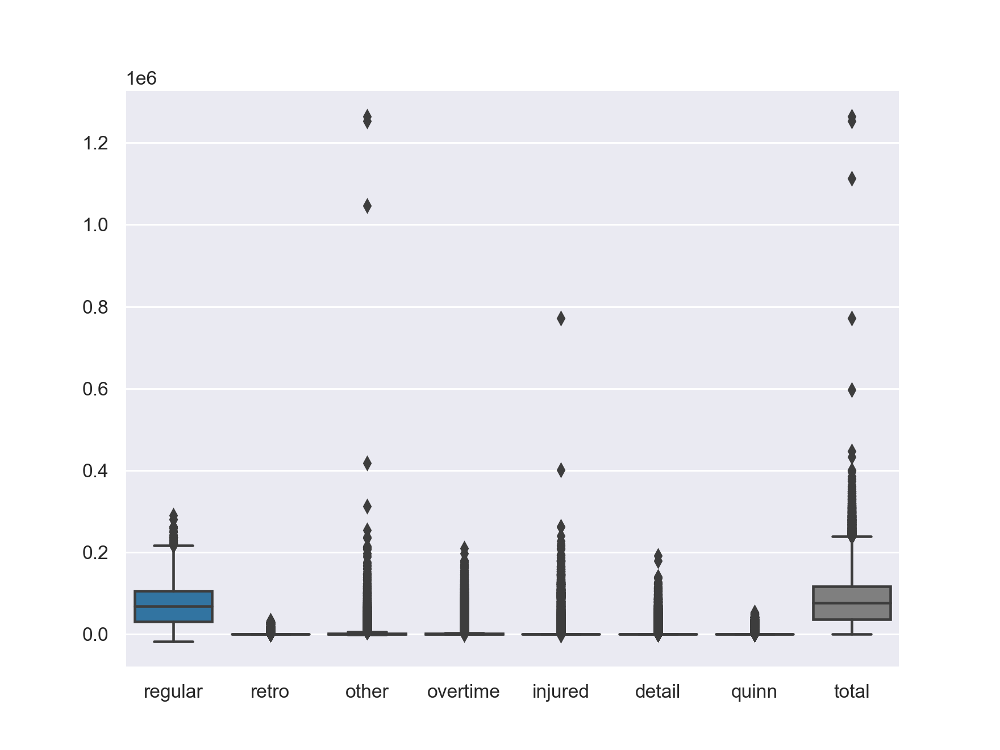

In [250]:
# Check for outliers and unusual patterns in numerical variables
plt.figure(figsize=(8, 6))
sns.boxplot(data=earnings[number_columns])
plt.show()


<IPython.core.display.Javascript object>


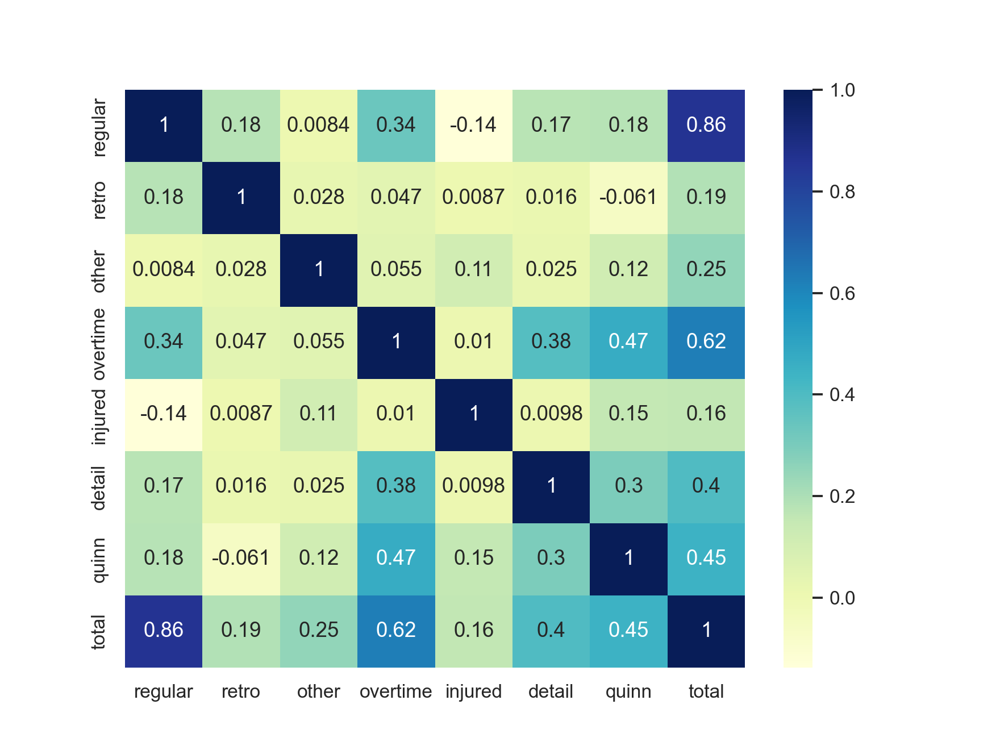

In [251]:
# Calculate correlation matrix to identify variable relationships
plt.figure(figsize=(8, 6))
correlation_matrix = earnings[number_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="YlGnBu")
plt.show()


In [260]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022,Boston Police Department
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022,Boston Public Schools
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022,Boston Fire Department
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022,Boston Police Department
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022,Boston Police Department
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN


<IPython.core.display.Javascript object>


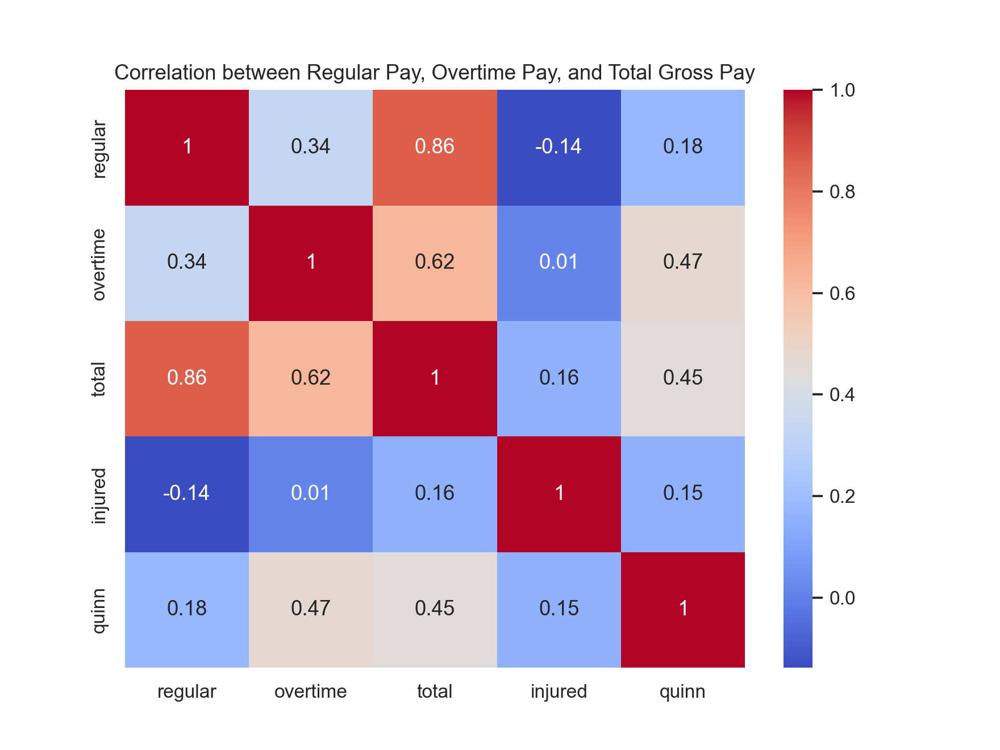

In [261]:
# Q2: Correlation between regular pay, overtime pay, and total gross pay

# Select the relevant numerical columns for Q2
correlation_columns = ['regular', 'overtime', 'total','injured','quinn']

# Calculate the correlation matrix
correlation_matrix = earnings[correlation_columns].corr()

# Create a heatmap to visualize the correlation
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation between Regular Pay, Overtime Pay, and Total Gross Pay')
plt.show()


     regular   overtime       total  injured     quinn
0   53226.90     463.52  1112348.25      0.0  12812.39
1  179109.61       0.00   596949.44      0.0      0.00
2  133653.78       0.00   446406.31      0.0      0.00
3  145775.26  196515.25   397258.69      0.0  29155.26
4  142535.62  142692.38   386054.33      0.0  35633.88


<IPython.core.display.Javascript object>


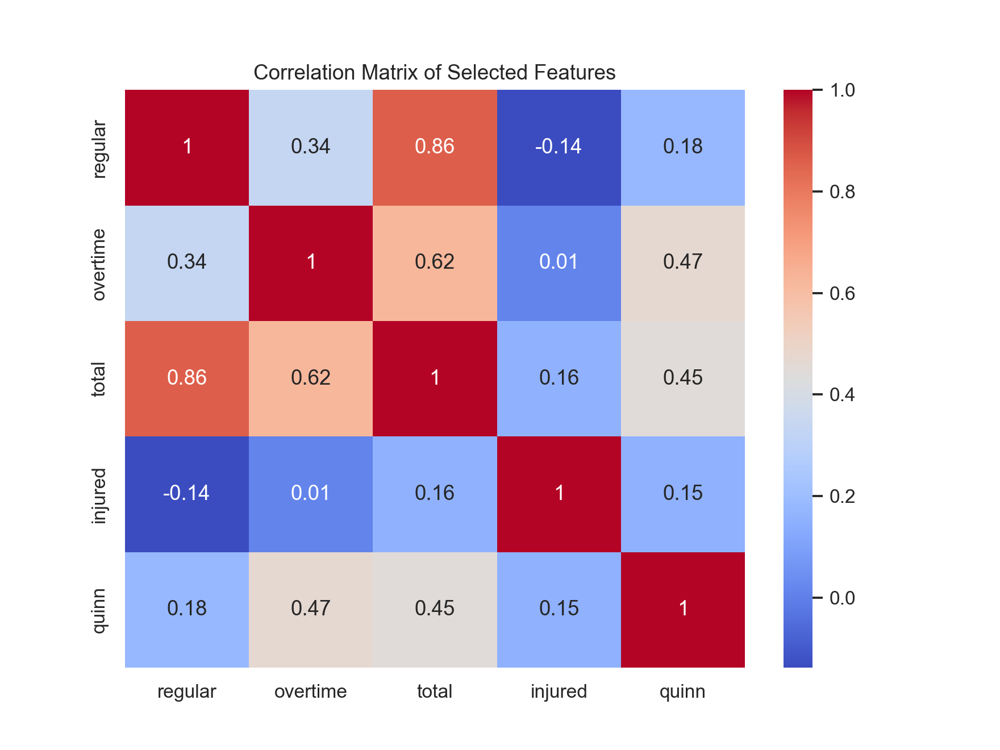

In [281]:
# numerical features based on correlation coefficients
selected_features = ['regular', 'overtime', 'total','injured','quinn']
data_selected_features = earnings[selected_features]

 # Display the first few rows of the selected features DataFrame
print(data_selected_features.head())

 # Check for multicollinearity using a correlation matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(data_selected_features.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Selected Features')
plt.show()


In [287]:
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error

# # Split the data 
# X = data_selected_features.drop('total', axis=1)
# y = data_selected_features['total']
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# model = LinearRegression()
# model.fit(X_train, y_train)
# y_pred = model.predict(X_test)

# # Evaluate the model performance
# mse = mean_squared_error(y_test, y_pred)
# print('Mean Squared Error:', mse)


<IPython.core.display.Javascript object>


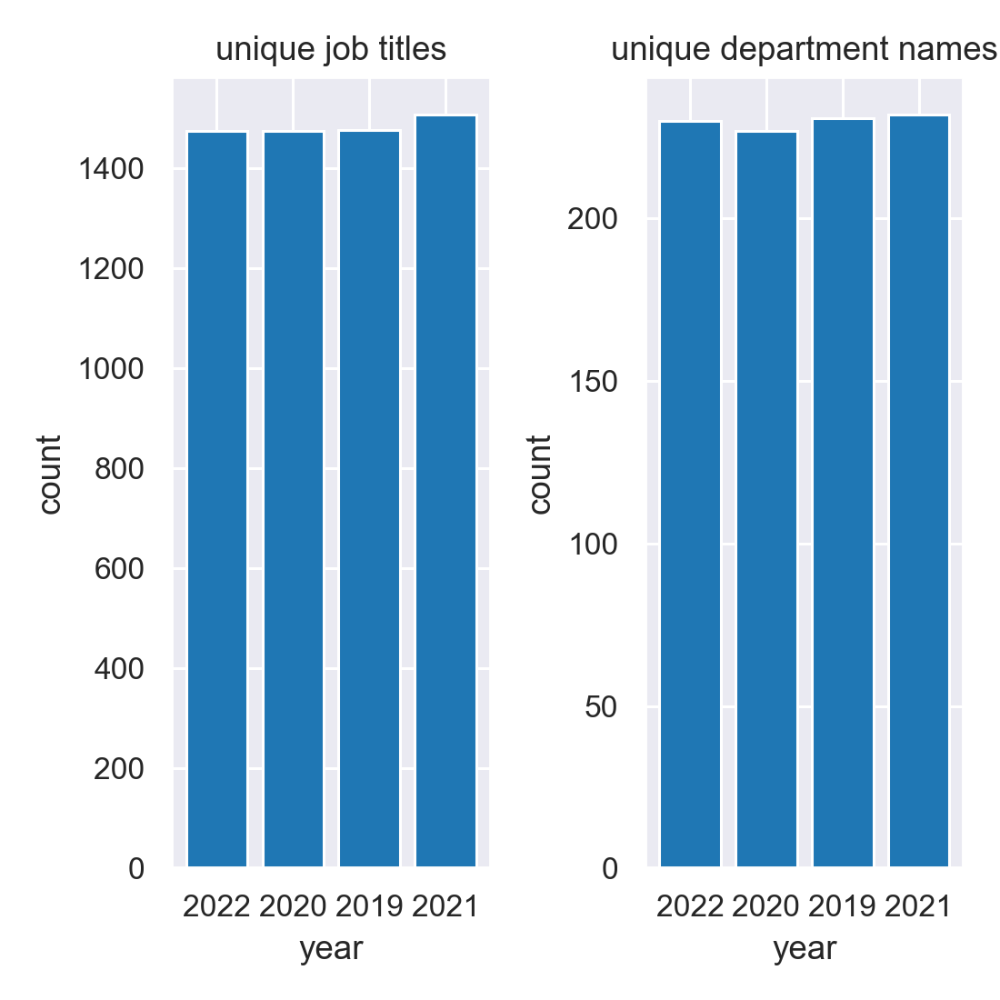

In [283]:
# unique job titles and departments by year
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(5,5))
ax1.bar(earnings['year'].unique(), earnings.groupby('year')['title'].nunique())
ax1.set_title('unique job titles')
ax1.set_ylabel('count')
ax1.set_xlabel('year')
plt.show()
ax2.bar(earnings['year'].unique(), earnings.groupby('year')['department'].nunique())
ax2.set_title('unique department names')
ax2.set_ylabel('count')
ax2.set_xlabel('year')

plt.tight_layout()
plt.show()


In [288]:
# combine all school departments into a single "Boston Public Schools" department

earnings['dept_clean'] = earnings['department'] # all others to stay the same

earnings['dept_clean'] = np.where(earnings.department.astype(str).str[:3] == \
                                  'BPS', 'Boston Public Schools', earnings.dept_clean)


bps = ['K-8', 'EEC', 'ELC', 'Middle', 'School', 'Academy', 'Elementary', 'Greenwood', 
       'E Leadership Acad', 'UP Academy Dorchester', 'UP "Unlocking Potential" Acad', 
       'Lyon Pilot High 9-12', 'Ellison/Parks EES', 'Chief Academic Officer', 
       'UP Academy Holland', 'Achievement Gap', 'English Language Learn', 'Haley Pilot',
       'Greater Egleston High', 'Early Learning Services', 'Career & Technical Ed', 
       'Teaching & Learning', 'Unified Student Svc', 'Superintendent',
       'Student Support Svc', 'Harbor High', 'Fam & Student Engagemt', 
       'Enrollment Services', 'Food & Nutrition Svc', 'HPEC: Com Acd Science & Health',
       'Institutional Advancemt', 'Legal Advisor', 'Professional Developmnt', 
       'Chief Operating Officer', 'Research Assess & Eval', 'Info & Instr Technology',
       'BTU Pilot', 'Boston Collaborative High Sch', 'Diplomas Plus', 'Chief Financial Officer']
for school in bps:
    earnings['dept_clean'] = np.where(earnings.department.astype(str).str[-len(school):] == \
                                      school, 'Boston Public Schools', earnings.dept_clean)

In [289]:
earnings.dept_clean

0        Boston Police Department
1           Boston Public Schools
2          Boston Fire Department
3        Boston Police Department
4        Boston Police Department
                   ...           
90921                         NaN
90922                         NaN
90923                         NaN
90924                         NaN
90925                         NaN
Name: dept_clean, Length: 90926, dtype: object

In [290]:
print(set(earnings.dept_clean.loc[earnings.year == '2021'].unique()) - \
      set(earnings.dept_clean.loc[earnings.year == '2022'].unique()))

{nan, 'Office of RRE', 'Office of Economic Development', 'Neighborhood Development'}


In [291]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN


In [292]:
#Rename various departments to 2022 departments name:

dept_names = {'Office of Economic Development':'BPS Business Service',
              'Neighborhood Development':'Office of Housing',
              'Office of RRE':'Road to Success'}
for d in dept_names:
    earnings['dept_clean'] = np.where(earnings['department'].str[-len(d):] == \
                                 d, dept_names[d], earnings.dept_clean)

In [293]:
# police titles:
police_titles = earnings.loc[(earnings.department == 'Boston Police Department')\
                            & (earnings.title.str.startswith('Police'))\
                            & (earnings.year == '2022')]\
                            ['title'].value_counts()
print(police_titles)

Police Officer                    1289
Police Detective                   291
Police Sergeant                    139
Police Sergeant (Det)              117
Police Lieutenant                   53
Police Offc Comm Serv Offc 3$8      47
Police Offc Mobile Offc 2$6         45
Police Clerk And Typist             41
Police Offc Acad Instr 2$6          29
Police Lieutenant (Det)             28
Police Offc/FgrPrt Ev Tch 4$10      24
Police Officer Hdq Dispatch         19
Police Captain/DDC                  16
Police Offc Canine 2$6              16
Police Offc Harborboat 3$8          11
Police Sergeant/Comm Serv Offc      11
Police Sergeant/CHF RADIO DISP      11
Police Offc/Bomb Squad              11
Police Offc/Juvenile Offc 4$10       9
Police Offc/Auto Invest 4$10         9
Police Offc Canine Offc 2$6          8
Police Offc/Hosp Liaison 4$10        7
Police Sergeant/FgrPrt Ev Tech       7
Police Sergeant/Mobile Oper          6
PoliceSergeant/SupvCourtCases        6
Police Offc Bomb Squad   

In [294]:
#Police dectives are police officers who perform detective work
# consolidate police department titles

earnings['title_clean'] = earnings['title'] # all others to stay the same
pol = {'Police Of': 'Police Officer', 
#         'Police De': 'Police Officer',
        'Police Se': 'Police Sergeant',
        'PoliceSer': 'Police Sergeant',
        'Police Li': 'Police Lieutenant',
        'Police Ca': 'Police Captain'}
for p in pol:
    earnings['title_clean'] = np.where(earnings.title.str[:9] == p, pol[p], earnings.title_clean)

In [295]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN


<IPython.core.display.Javascript object>


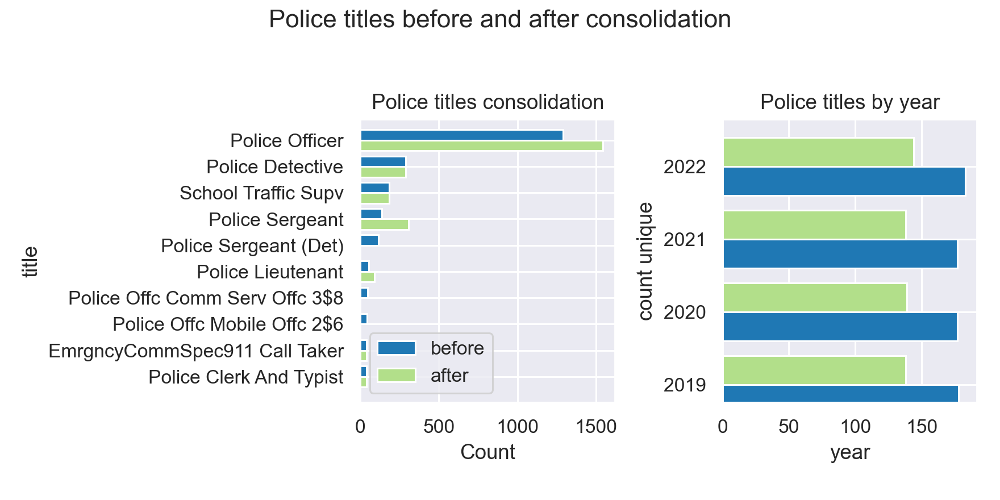

In [296]:
# Display before and after stats

# most common police department titles before adjustment:
before = earnings['title'][(earnings.department == 'Boston Police Department') \
                                        & (earnings.year == '2022')] \
                                        .value_counts() \
                                        .nlargest(10) \
                                        .reset_index() 
# after adjustment
after = earnings['title_clean'][(earnings.department == 'Boston Police Department') \
                                        & (earnings.year == '2022')] \
                                        .value_counts() \
                                        .nlargest(10) \
                                        .reset_index() 
# combine and sort    
joined = pd.merge(before, after, how='left') \
                        .fillna(0) \
                        .sort_values(by=['title'], ascending=False) \
                        .rename(index=str, columns={'index': 'title', 'title': 'before', 'title_clean': 'after'})

# data by year
titles_by_year = pd.pivot_table(earnings[earnings['dept_clean'] == 'Boston Police Department'],\
                            values=['title', 'title_clean'], columns='year', aggfunc=pd.Series.nunique) \
                        .sort_values(by='2022', ascending=False)[:10] \
                        .transpose() \
                        .reset_index()

# plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
fig.suptitle('Police titles before and after consolidation')

joined.plot.barh('title', 'before', ax=ax1, width=0.4, color='#1f78b4', position=1).invert_yaxis()
joined.plot.barh('title', 'after', ax=ax1, width=0.4, color='#b2df8a', position=0).invert_yaxis()
ax1.set_title('Police titles consolidation')
ax1.set_xlabel('Count')
ax1.set_ylim(10, -0.8)

titles_by_year.plot('year', 'title', kind='barh', ax=ax2, width=0.4, color='#1f78b4', position=1, label='before', legend=False)
titles_by_year.plot('year', 'title_clean', kind='barh', ax=ax2, width=0.4, color='#b2df8a', position=0, label='after', legend=False)
ax2.set_title('Police titles by year')
ax2.set_xlabel('year')
ax2.set_ylabel('count unique')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [303]:
# police titles:
fire_titles = earnings.loc[(earnings.department == 'Boston Fire Department')\
                            & (earnings.title.str.startswith('S'))]\
                            ['title_clean'].value_counts()
print(fire_titles)

Sr Admin (Fire)                   72
Sr Fire Alarm Operator            21
Sr Data Proc Sys Anl              20
Supn (Bfd/Fad)                     5
Sr Fire Alarm Oper (Train Ofc)     5
Sr Legal Asst (Fire Dpt)           4
Supv -  Management Svcs            3
Name: title_clean, dtype: int64


In [304]:
# consolidate fire department titles

fd = {'FF': 'Fire Fighter', 
      'Fire Fi': 'Fire Fighter',
      'FireFig': 'Fire Fighter',
      'Fire Ca': 'Fire Captain',
      'Fire L': 'Fire Lieutenant',
      'FireLi': 'Fire Lieutenant',
      'FireLt': 'Fire Lieutenant',
      'Distric': 'District Fire Chief',
      'Dist Fi': 'District Fire Chief',
      'DistFCh': 'District Fire Chief',
      'Dep Fir': 'Dep Fire Chief',
      'DepFire': 'Dep Fire Chief'}

for k in fd:
    earnings['title_clean'] = np.where(earnings.title.astype(str).str[:len(k)] == k, fd[k], earnings.title_clean)

earnings['title_clean'] = np.where((earnings.title.str[:10] == 'Sr Admin A') \
                                   & (earnings.dept_clean == 'Boston Fire Department'),\
                                   'Sr Admin (Fire)', earnings.title_clean)

fd_titles = earnings.title_clean.loc[(earnings.dept_clean == 'Boston Fire Department')]
print('Number of unique job titles in fire department:', len(set(fd_titles)))
print(fd_titles.value_counts().nlargest(10))

Number of unique job titles in fire department: 85
Fire Fighter                      4594
Fire Lieutenant                    963
Fire Captain                       326
District Fire Chief                233
Fire Alarm Operator                 87
Dep Fire Chief                      78
Sr Admin (Fire)                     72
Head Clerk                          42
Prin Admin Asst                     23
Hvy Mtr Equip Repairperson BFD      21
Name: title_clean, dtype: int64


<IPython.core.display.Javascript object>


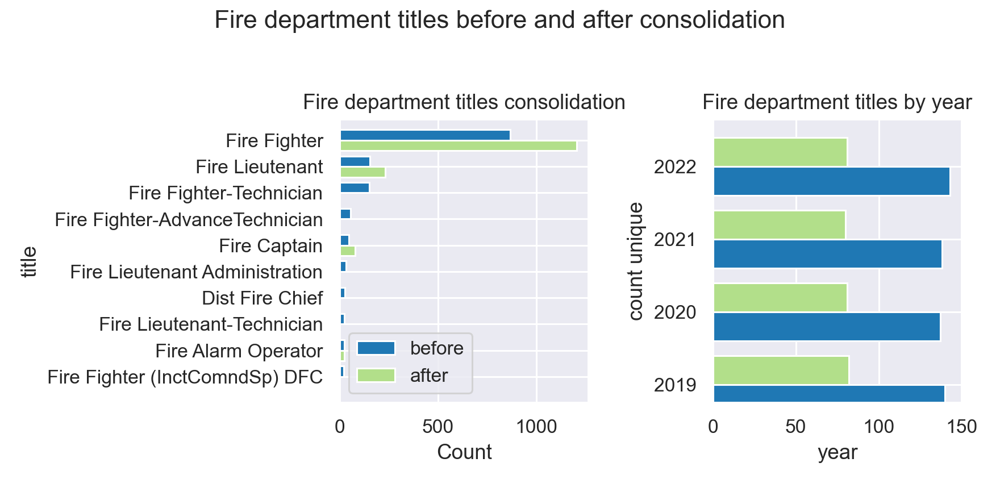

In [299]:
# Display before and after stats

# most common police department titles before adjustment:
before = earnings['title'][(earnings.department == 'Boston Fire Department') \
                                        & (earnings.year == '2022')] \
                                        .value_counts() \
                                        .nlargest(10) \
                                        .reset_index() 
# after adjustment
after = earnings['title_clean'][(earnings.department == 'Boston Fire Department') \
                                        & (earnings.year == '2022')] \
                                        .value_counts() \
                                        .nlargest(10) \
                                        .reset_index() 
# combine and sort    
joined = pd.merge(before, after, how='left') \
                        .fillna(0) \
                        .sort_values(by=['title'], ascending=False) \
                        .rename(index=str, columns={'index': 'title', 'title': 'before', 'title_clean': 'after'})

# data by year
titles_by_year = pd.pivot_table(earnings[earnings['dept_clean'] == 'Boston Fire Department'],\
                            values=['title', 'title_clean'], columns='year', aggfunc=pd.Series.nunique) \
                        .sort_values(by='2022', ascending=False)[:10] \
                        .transpose() \
                        .reset_index()

# plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
fig.suptitle('Fire department titles before and after consolidation')

joined.plot.barh('title', 'before', ax=ax1, width=0.4, color='#1f78b4', position=1).invert_yaxis()
joined.plot.barh('title', 'after', ax=ax1, width=0.4, color='#b2df8a', position=0).invert_yaxis()
ax1.set_title('Fire department titles consolidation')
ax1.set_xlabel('Count')
ax1.set_ylim(10, -0.8)

titles_by_year.plot('year', 'title', kind='barh', ax=ax2, width=0.4, color='#1f78b4', position=1, label='before', legend=False)
titles_by_year.plot('year', 'title_clean', kind='barh', ax=ax2, width=0.4, color='#b2df8a', position=0, label='after', legend=False)
ax2.set_title('Fire department titles by year')
ax2.set_xlabel('year')
ax2.set_ylabel('count unique')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

<IPython.core.display.Javascript object>


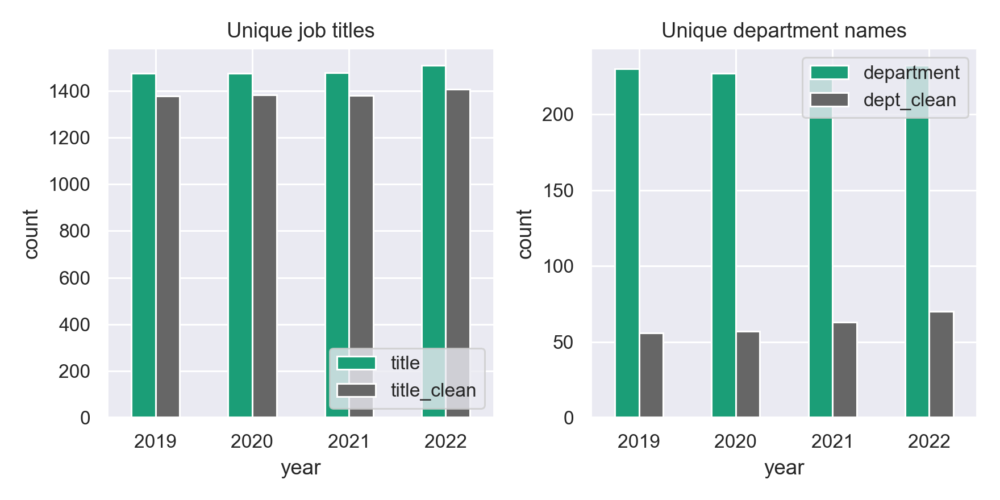

In [300]:
# unique job titles and departments by year
title_gb = earnings.groupby('year')[['title', 'title_clean']].nunique()
dept_gb = earnings.groupby('year')[['department', 'dept_clean']].nunique()

# plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
title_gb.plot.bar(ax=ax1, cmap='Dark2', rot=0)
ax1.set_title('Unique job titles')
ax1.set_ylabel('count')
ax1.set_xlabel('year')
ax1.legend(loc=4, frameon=True, framealpha=0.8)

dept_gb.plot.bar(ax=ax2, cmap='Dark2', rot=0)
ax2.set_title('Unique department names')
ax2.set_ylabel('count')
ax2.set_xlabel('year')

plt.tight_layout()
plt.show()

In [305]:
# total payroll by year
total_payroll = earnings.groupby(earnings['year'])[['regular', 'total', 'name']]\
                        .agg({'regular': np.sum, 'total': np.sum, 'name': 'count'})\
                        .reset_index()\
                        .set_index('year')



In [306]:
# Feature Enginerring
total_payroll['epc'] = total_payroll['total'] / total_payroll['name'] # average total earnings per capita
total_payroll['rpc'] = total_payroll['regular'] / total_payroll['name'] # average regular earnings per capita
total_payroll = total_payroll.reset_index()



In [307]:
total_payroll

,year,regular,total,name,epc,rpc
0,2019,1.470649e+09,1.796738e+09,23312,77073.528048,63085.494363
1,2020,1.526868e+09,1.819950e+09,21858,83262.399459,69853.952622
2,2021,1.553540e+09,1.866643e+09,22546,82792.663187,68905.345421
3,2022,1.600741e+09,1.930625e+09,23204,83202.257179,68985.553452


In [308]:
from scipy import interpolate


In [309]:
# AVERAGE WEDGE INDEX
total_payroll['awi'] = pd.Series([52,145.80,54,099.99,55,628.60,60,575.07]) # AWI, years 2018-2021


In [491]:
# AVERGAE BOSTON POPULATION

year_actual, pop_actual = np.array([2019,2020,2021,2022]), \
                        np.array([692600, 675647, 654283, 663877,])

f = interpolate.interp1d(year_actual, pop_actual, fill_value='extrapolate')
population = np.append(pop_actual, f(2022))


<IPython.core.display.Javascript object>


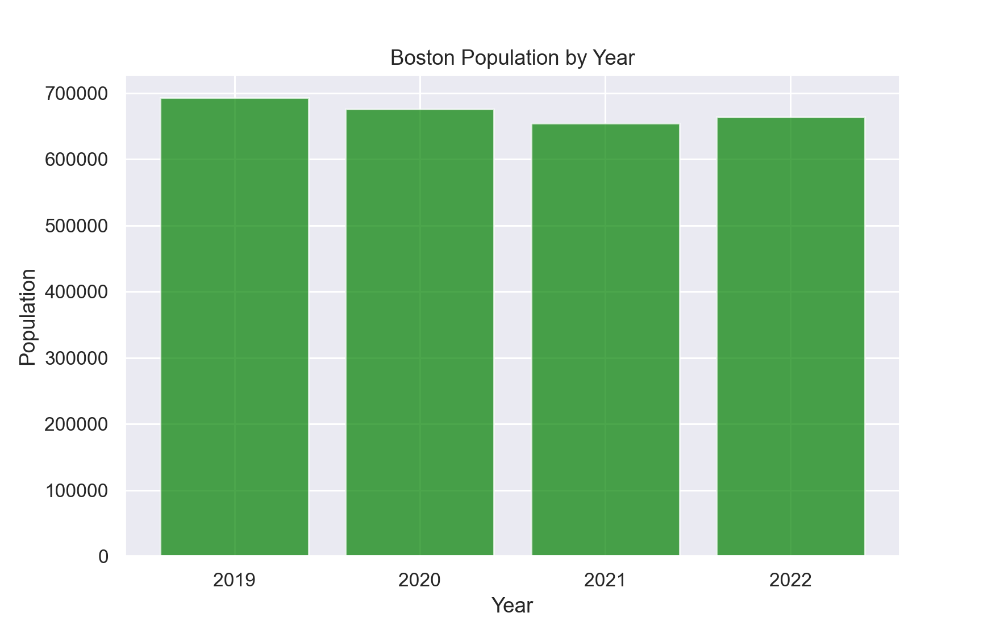

In [492]:
plt.figure(figsize=(8, 5))
plt.bar(year_actual, pop_actual, color='g', alpha=0.7)
plt.xlabel('Year')
plt.ylabel('Population')
plt.title('Boston Population by Year')
plt.xticks(year_actual)
plt.show()


<IPython.core.display.Javascript object>


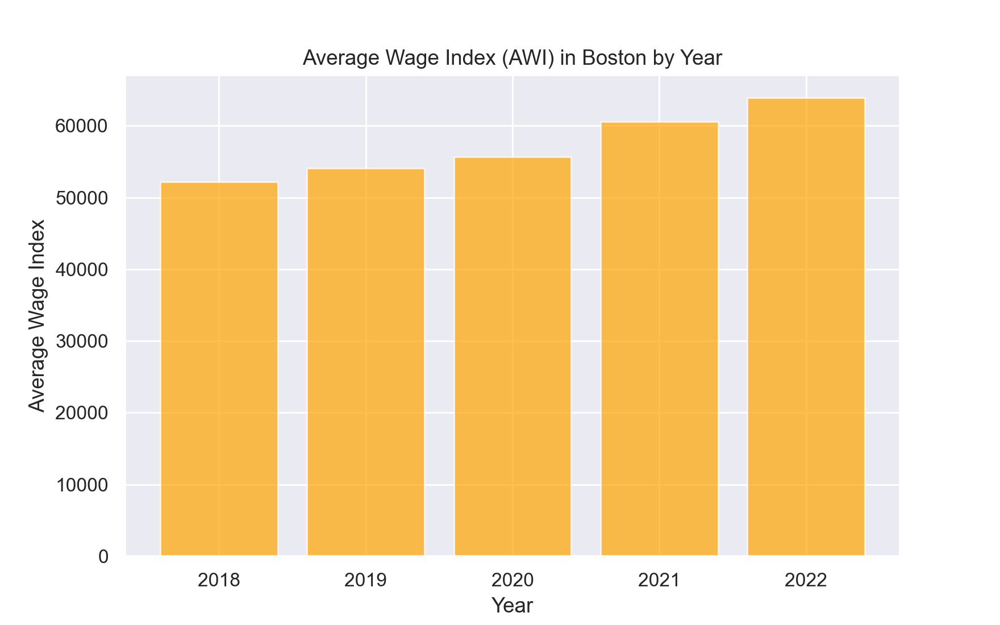

In [493]:
year_actual = [2018, 2019, 2020, 2021, 2022]
awi_values = [52_145.80, 54_099.99, 55_628.60, 60_575.07, 63_877]

plt.figure(figsize=(8, 5))
plt.bar(year_actual, awi_values, color='orange', alpha=0.7)
plt.xlabel('Year')
plt.ylabel('Average Wage Index')
plt.title('Average Wage Index (AWI) in Boston by Year')
plt.xticks(year_actual)
plt.show()


In [311]:
population

array([692600., 675647., 654283., 663877., 726506.])

In [312]:
import matplotlib.pyplot as plt

# create a single subplot
fig, ax1 = plt.subplots(figsize=(4, 5))

x = total_payroll['year']
# Total payroll by year
ax1.bar(x, total_payroll['total']/1000000)
ax1.set_xlabel('year')
ax1.set_ylabel('annual payroll expenditure (millions $)')
ax1.set_title('Total payroll by year')


<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Total payroll by year')

<IPython.core.display.Javascript object>


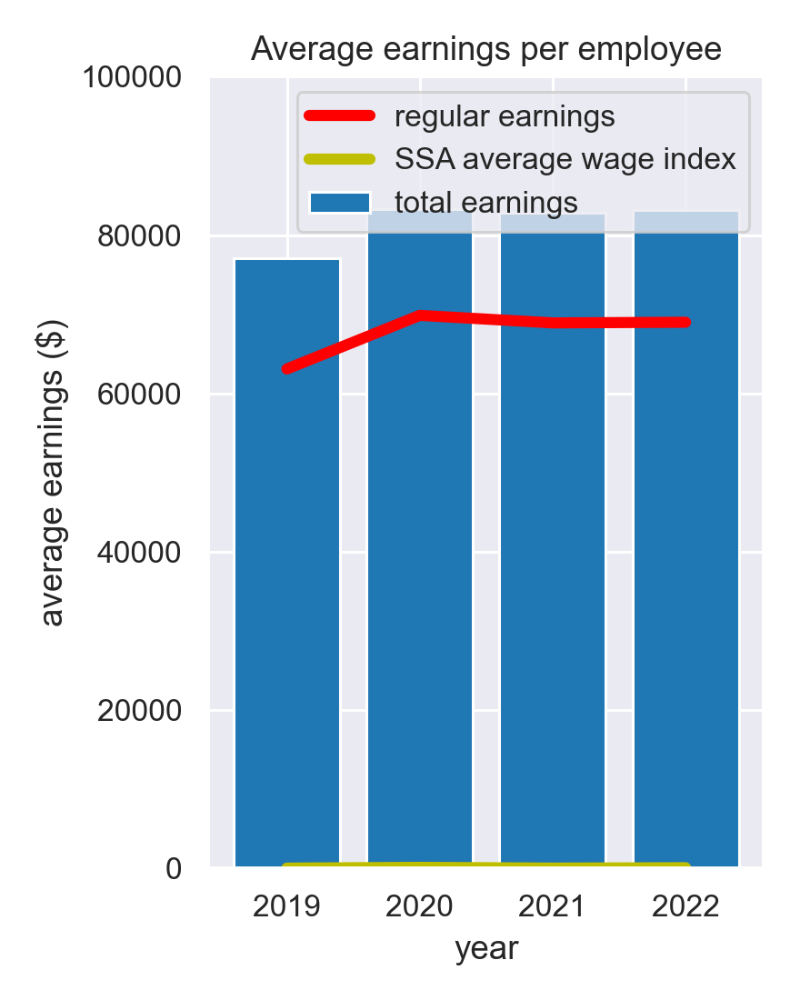

In [313]:
# create a single subplot
fig, ax1 = plt.subplots(figsize=(4, 5))

x = total_payroll['year']
# Average earnings per employee
ax1.bar(x, total_payroll['epc'])
ax1.plot(x, total_payroll['rpc'], alpha=1, color='r', linewidth=4)
ax1.plot(x, total_payroll['awi'], color='y', linewidth=4)
ax1.set_xlabel('year')
ax1.set_ylabel('average earnings ($)')
ax1.set_title('Average earnings per employee')
ax1.legend(['regular earnings', 'SSA average wage index', 'total earnings'])
ax1.set_ylim(0, 100000)

plt.tight_layout()
plt.savefig('test.png', dpi=300)
plt.show()


In [314]:
# get top 10 titles by number of employees
titles_top10 = earnings\
                .groupby('title_clean')\
                .agg('size')\
                .sort_values(ascending=False)\
                .index[:10]

# get top 10 departments by number of employees

departments_top10 = earnings\
                .groupby('dept_clean')\
                .agg('size')\
                .sort_values(ascending=False)\
                .index[:10]
print(titles_top10)
print(departments_top10)

Index(['Teacher', 'Police Officer', 'Paraprofessional', 'Fire Fighter',
       'Part-Time Cafeteria Attendant', 'Police Sergeant',
       'Lunch Hour Monitors', 'Police Detective', 'Substitute Teacher',
       'Substitute Teacher HE'],
      dtype='object', name='title_clean')
Index(['Boston Public Schools', 'Boston Police Department',
       'Boston Fire Department', 'Boston Public Library',
       'Boston Cntr - Youth & Families', 'Public Works Department',
       'Traffic Division', 'Parks Department', 'Inspectional Services Dept',
       'Property Management'],
      dtype='object', name='dept_clean')


<IPython.core.display.Javascript object>


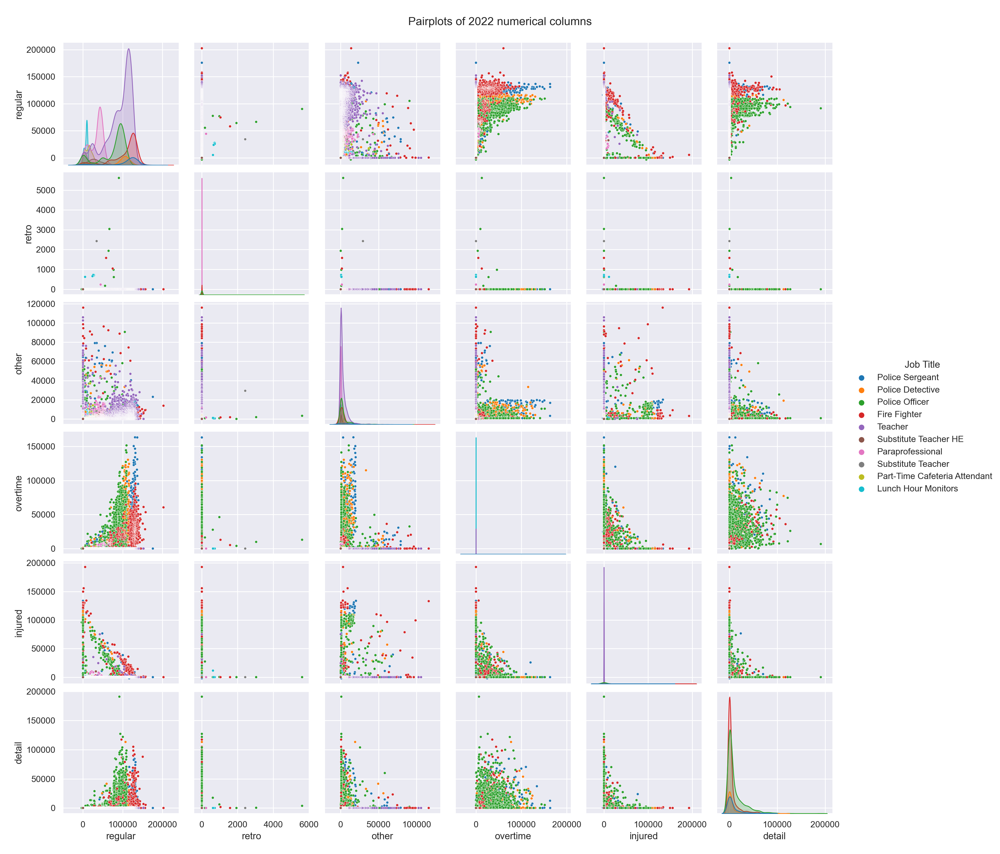

In [482]:
# extract 10 most common job titles
titles = earnings[(earnings['title_clean'].isin(titles_top10)) & (earnings['year'] == '2022')] \
                .rename(index=str, columns={'title_clean': 'Job Title'})  # for plot legend

usecols = ['regular', 'retro', 'other', 'overtime', 'injured', 'detail']

# plot
g = sns.pairplot(titles, hue='Job Title', vars=usecols, plot_kws={'s': 10, 'alpha': 1.0}, palette="tab10")
g.fig.suptitle('Pairplots of 2022 numerical columns')
g.fig.subplots_adjust(top=0.95)
plt.show()


In [317]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN


In [318]:
earnings.to_csv('earnings.csv', index=False)

In [319]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021,NaN,NaN


In [320]:
#time series analysis to analyze earnings trends over the years
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Convert the 'year' column to datetime for time series analysis
earnings['year'] = pd.to_datetime(earnings['year'], format='%Y')


In [321]:
# Group by year and calculate the total earnings for each year
earnings_by_year = earnings.groupby('year')['total'].sum()


<IPython.core.display.Javascript object>


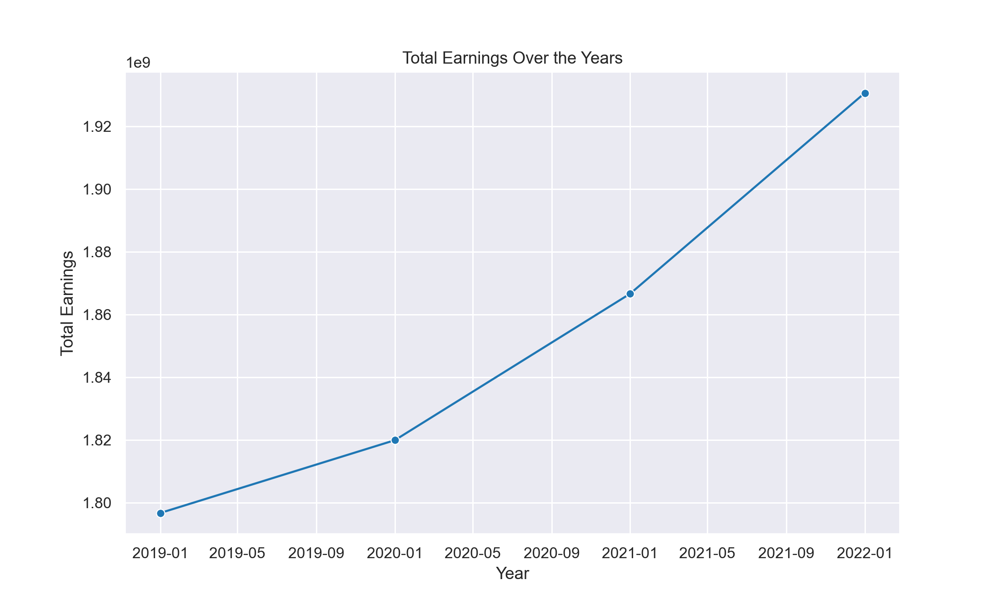

In [494]:

# Plot the time series of total earnings over the years
plt.figure(figsize=(10, 6))
sns.lineplot(data=earnings_by_year, marker='o')
plt.title('Total Earnings Over the Years')
plt.xlabel('Year')
plt.ylabel('Total Earnings')
plt.show()

In [322]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022-01-01,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022-01-01,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022-01-01,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022-01-01,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022-01-01,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN


In [ ]:
### ML MODELS

In [329]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022-01-01,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022-01-01,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022-01-01,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022-01-01,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022-01-01,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN


2022 number of employees: 6805


<IPython.core.display.Javascript object>


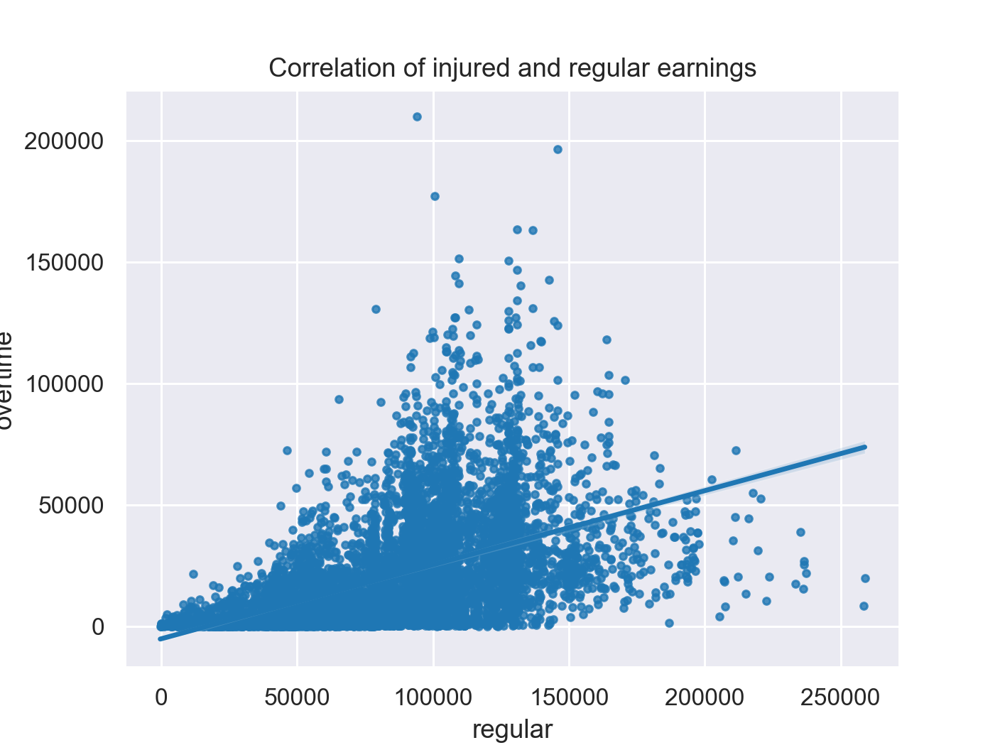

In [340]:
overtime = earnings[(earnings.overtime > 1) & (earnings.year == '2022')]

print('2022 number of employees:', overtime.shape[0])
plt.figure()
g1 = sns.regplot(x='regular', y='overtime', data=overtime, scatter_kws={'s':10})
g1.set_title('Correlation of injured and regular earnings')
plt.show()

In [331]:
earnings.overtime

0           463.52
1             0.00
2             0.00
3        196515.25
4        142692.38
           ...    
90921         0.00
90922         0.00
90923         0.00
90924         0.00
90925         0.00
Name: overtime, Length: 90926, dtype: float64

2022 number of employees: 2002


<IPython.core.display.Javascript object>


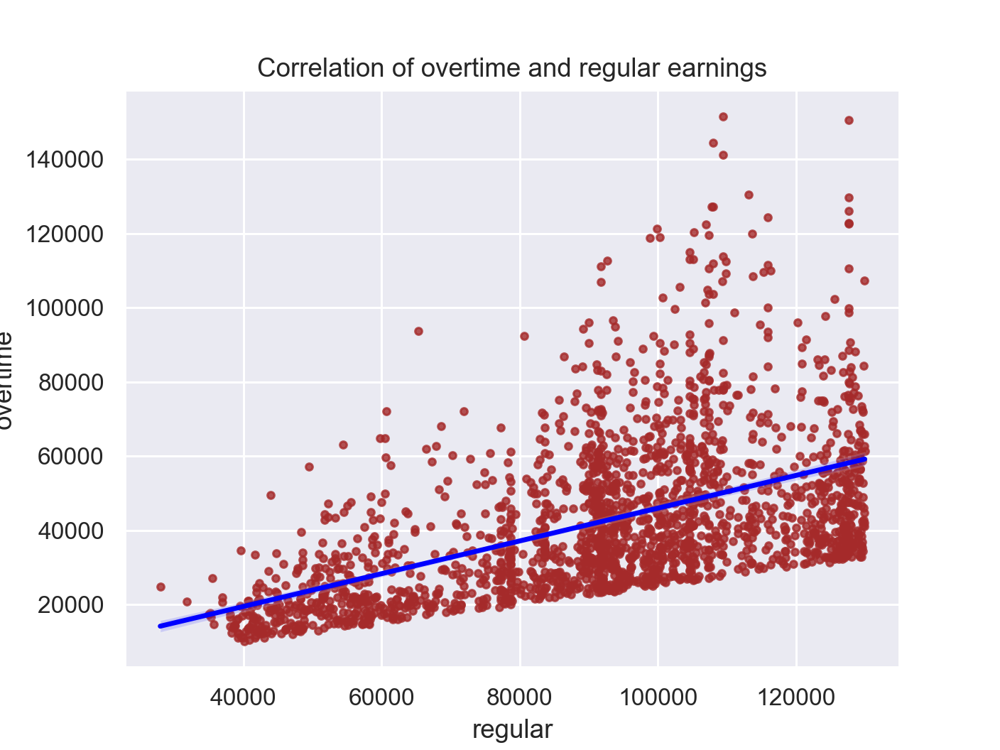

In [389]:
#dataset focused on 'normal' income levels with both regular and injured earnings types

overtime = earnings[((earnings.overtime + earnings.regular) > 50000) \
                   & (earnings.regular < 130000) \
                   & (earnings.overtime > 6000) \
                   & (earnings.overtime / earnings.regular > 0.25) \
                   & (earnings.overtime / earnings.regular < 1.5) \
                   & (earnings.year == '2022')]\
                    [['regular', 'overtime']]

print('2022 number of employees:', overtime.shape[0])
plt.figure()
g2 = sns.regplot(x='regular', y='overtime', data=overtime, scatter_kws={'s':10, 'color': 'brown'}, color = 'blue')
g2.set_title('Correlation of overtime and regular earnings')
plt.show()

In [390]:
from statsmodels.formula.api import ols

m = ols('regular ~ overtime', overtime).fit()
print(m.summary())

                            OLS Regression Results                            
Dep. Variable:                regular   R-squared:                       0.263
Model:                            OLS   Adj. R-squared:                  0.263
Method:                 Least Squares   F-statistic:                     714.5
Date:                Sat, 29 Jul 2023   Prob (F-statistic):          7.49e-135
Time:                        19:14:22   Log-Likelihood:                -22777.
No. Observations:                2002   AIC:                         4.556e+04
Df Residuals:                    2000   BIC:                         4.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   6.681e+04   1058.676     63.108      0.0

In [427]:
# earnings['quin_regular'] = earnings['quinn'] / earnings['regular']

In [448]:
# earnings['dept_clean'].value_counts()['Boston Police Department']
# earnings['dept_clean'].value_counts()['Boston Fire Department']
# earnings['dept_clean'].value_counts()['Boston Public Schools']

54593

<IPython.core.display.Javascript object>


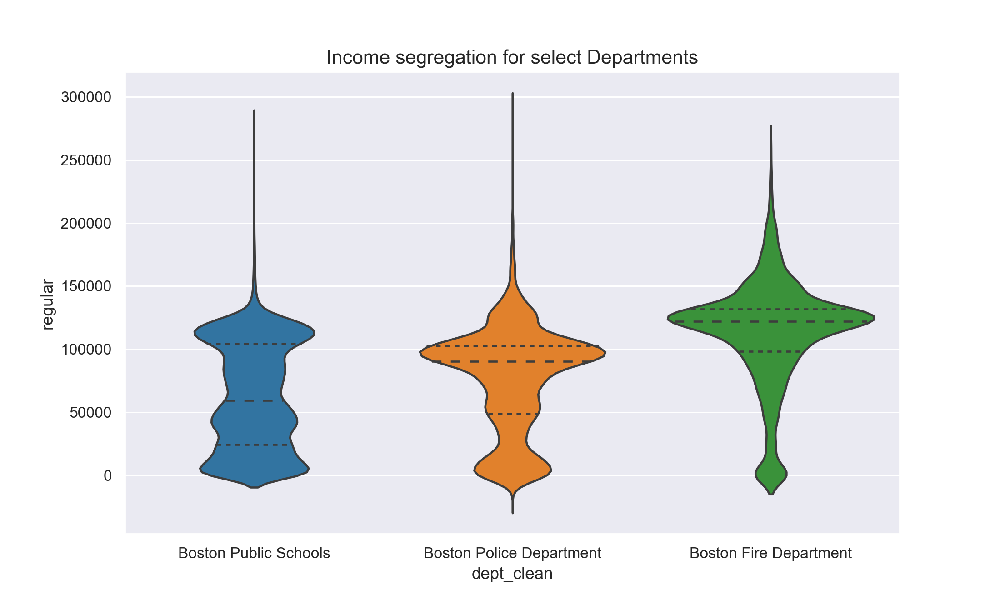

In [483]:
# dept_income = pd.DataFrame.from_dict({'Boston Police Department': 'PD', 'Boston Fire Department': 'FD', 'Boston Public Schools': 'School'}, orient='index')\
#                             .reset_index()
dept_income = {'Boston Police Department', 'Boston Fire Department', 'Boston Public Schools'}

seg = earnings[(earnings['dept_clean'].isin(dept_income))]

plt.figure(figsize=(10, 6))
g4 = sns.violinplot(x='dept_clean', y='regular',order=['Boston Public Schools', 'Boston Police Department', 'Boston Fire Department'], data=seg, inner='quartile')
g4.set_title('Income segregation for select Departments', fontsize=14)
plt.show()

In [479]:
# Calculate the percentage increase in income after deducting quinn income
earnings['income_increase_percent'] = ((earnings['regular'] - earnings['quinn']) / earnings['quinn']) * 100


In [468]:
earnings 

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022-01-01,Boston Police Department,Police Lieutenant
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022-01-01,Boston Public Schools,Superintendent
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022-01-01,Boston Fire Department,Commissioner (BFD)
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022-01-01,Boston Police Department,Police Lieutenant
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022-01-01,Boston Police Department,Police Lieutenant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN


In [480]:

# Function to categorize employees based on their income increase percentage
def categorize_degree(income_increase_percent):
    if income_increase_percent >= 25:
        return 'Master'
    elif income_increase_percent >= 20:
        return 'Bachelor'
    elif income_increase_percent >= 10:
        return 'Associate'
    else:
        return 'No Higher Degree'
    


<IPython.core.display.Javascript object>


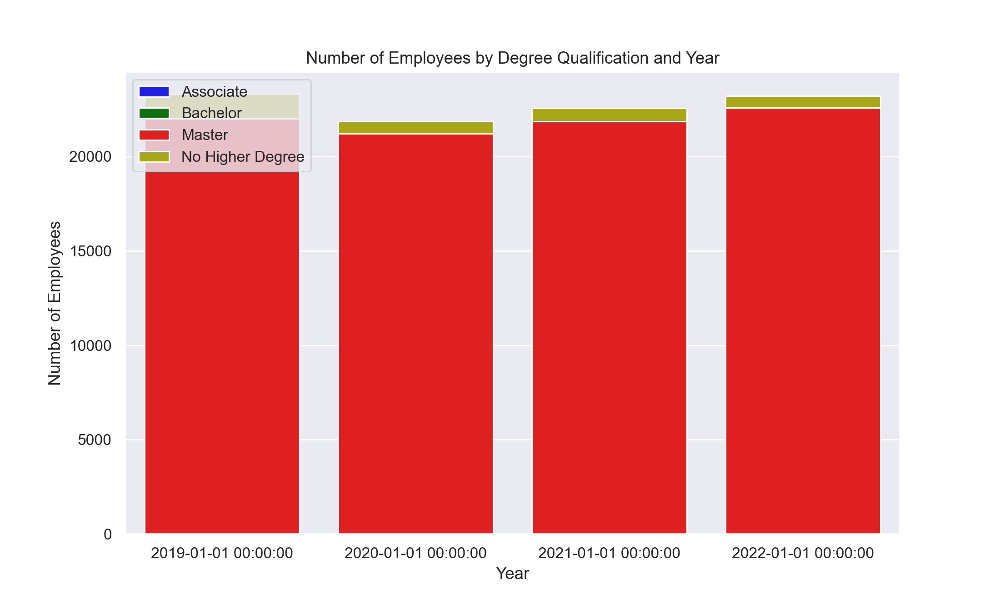

In [496]:
# Apply the categorize_degree function to create a new column 'degree_qualification'
earnings['degree_qualification'] = earnings['income_increase_percent'].apply(categorize_degree)

# Create a pivot table to get counts of employees for each degree qualification and year
degree_counts_by_year = pd.pivot_table(earnings, index='year', columns='degree_qualification', values='regular', aggfunc='count')

# Reorder the columns for the desired display order
degree_counts_by_year = degree_counts_by_year[['Associate', 'Bachelor', 'Master', 'No Higher Degree']]

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=degree_counts_by_year.index, y=degree_counts_by_year['Associate'], color='b', label='Associate')
sns.barplot(x=degree_counts_by_year.index, y=degree_counts_by_year['Bachelor'], color='g', bottom=degree_counts_by_year['Associate'], label='Bachelor')
sns.barplot(x=degree_counts_by_year.index, y=degree_counts_by_year['Master'], color='r', bottom=degree_counts_by_year['Bachelor']+degree_counts_by_year['Associate'], label='Master')
sns.barplot(x=degree_counts_by_year.index, y=degree_counts_by_year['No Higher Degree'], color='y', bottom=degree_counts_by_year['Master']+degree_counts_by_year['Bachelor']+degree_counts_by_year['Associate'], label='No Higher Degree')

plt.title('Number of Employees by Degree Qualification and Year')
plt.xlabel('Year')
plt.ylabel('Number of Employees')
plt.legend(loc='upper left')
plt.show()






In [499]:
import geopandas as gpd
import pandas as pd
import folium

# Sample earnings data with zip codes and regular salaries
data = earnings{'zip','regular'}

earnings_df = pd.DataFrame(data)


SyntaxError: invalid syntax (2576605313.py, line 6)

In [513]:
# zip code latitude and longitude data
zll = pd.read_csv('/Users/prajaktasable/Downloads/2021_Gaz_zcta_national.txt', sep='\t', encoding = "ISO-8859-1", usecols=[0, 5, 6], names=['zip', 'lat', 'long'], header=0, dtype={'zip': object})

# count employees per zip code
zip_count = earnings[earnings.year == '2022']\
                .groupby('zip')['name']\
                .agg(np.size)\
                .reset_index()\
                .rename(columns={'name': 'employees'})
zip_df = pd.merge(zip_count, zll, on='zip', how='inner')

In [576]:
earnings

,name,department,title,regular,retro,other,overtime,injured,detail,quinn,total,zip,year,dept_clean,title_clean,income_increase_percent,degree_qualification
0,"Gavin,Donna M.",Boston Police Department,Police Lieutenant (Det),53226.90,0.0,1045845.44,463.52,0.0,0.0,12812.39,1112348.25,02186,2022-01-01,Boston Police Department,Police Lieutenant,315.433030,Master
1,"Cassellius,Brenda",Superintendent,Superintendent,179109.61,0.0,417839.83,0.00,0.0,0.0,0.00,596949.44,55419,2022-01-01,Boston Public Schools,Superintendent,inf,Master
2,"Dempsey,John",Boston Fire Department,Commissioner (BFD),133653.78,0.0,312752.53,0.00,0.0,0.0,0.00,446406.31,02152,2022-01-01,Boston Fire Department,Commissioner (BFD),inf,Master
3,"Demesmin,Stanley",Boston Police Department,Police Lieutenant (Det),145775.26,0.0,13932.92,196515.25,0.0,11880.0,29155.26,397258.69,02052,2022-01-01,Boston Police Department,Police Lieutenant,399.996433,Master
4,"Smith,Sean P",Boston Police Department,Police Lieutenant,142535.62,0.0,18827.45,142692.38,0.0,46365.0,35633.88,386054.33,02186,2022-01-01,Boston Police Department,Police Lieutenant,300.000281,Master
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90921,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN,NaN,No Higher Degree
90922,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN,NaN,No Higher Degree
90923,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN,NaN,No Higher Degree
90924,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,02148,2021-01-01,NaN,NaN,NaN,No Higher Degree


In [559]:
# boston = pd.read_csv('/Users/prajaktasable/Downloads/ZIP_Codes.csv',usecols=[1], dtype={'zip': object})
boston = pd.read_csv('/Users/prajaktasable/Downloads/ZIP_Codes.csv', names=['zip'], usecols=[1], dtype={'zip': object})
boston = boston.drop(0)

In [566]:
# generate various zip code maps
boston = pd.merge(zip_df, boston, on='zip', how='inner')
suburbs = zip_df[~zip_df['zip'].isin(boston['zip'])]

In [521]:
zip_df

,zip,employees,lat,long
0,01002,1,42.377212,-72.464795
1,01028,2,42.062378,-72.498111
2,01035,1,42.356491,-72.568632
3,01036,1,42.071188,-72.417718
4,01057,1,42.093596,-72.321494
...,...,...,...,...
557,97006,1,45.525980,-122.855888
558,97202,1,45.482012,-122.644451
559,98052,1,47.682254,-122.120450
560,98109,1,47.630583,-122.345596


In [586]:
# by income level 
rich = earnings[(earnings['year'] == '2022') & (earnings['total'] >= 150000)].groupby('zip')['name'].agg(np.size).reset_index().rename(columns={'name': 'employees'})
poor = earnings[(earnings['year'] == '2022') & (earnings['total'] < 60000) & (earnings['total'] >= 20000)].groupby('zip')['name'].agg(np.size).reset_index().rename(columns={'name': 'employees'})
rich = rich.merge(zll, on='zip', how='left')
poor = poor.merge(zll, on='zip', how='left')

In [584]:
rich

,zip,employees,lat,long
0,01453,1,42.519967,-71.763319
1,01460,1,42.535931,-71.490569
2,01463,1,42.670643,-71.602858
3,01519,1,42.203404,-71.679739
4,01532,1,42.323342,-71.646236
...,...,...,...,...
130,02769,1,41.846878,-71.244870
131,02770,1,41.760864,-70.838956
132,03276,1,43.431031,-71.575998
133,03561,1,44.343351,-71.795118


<IPython.core.display.Javascript object>


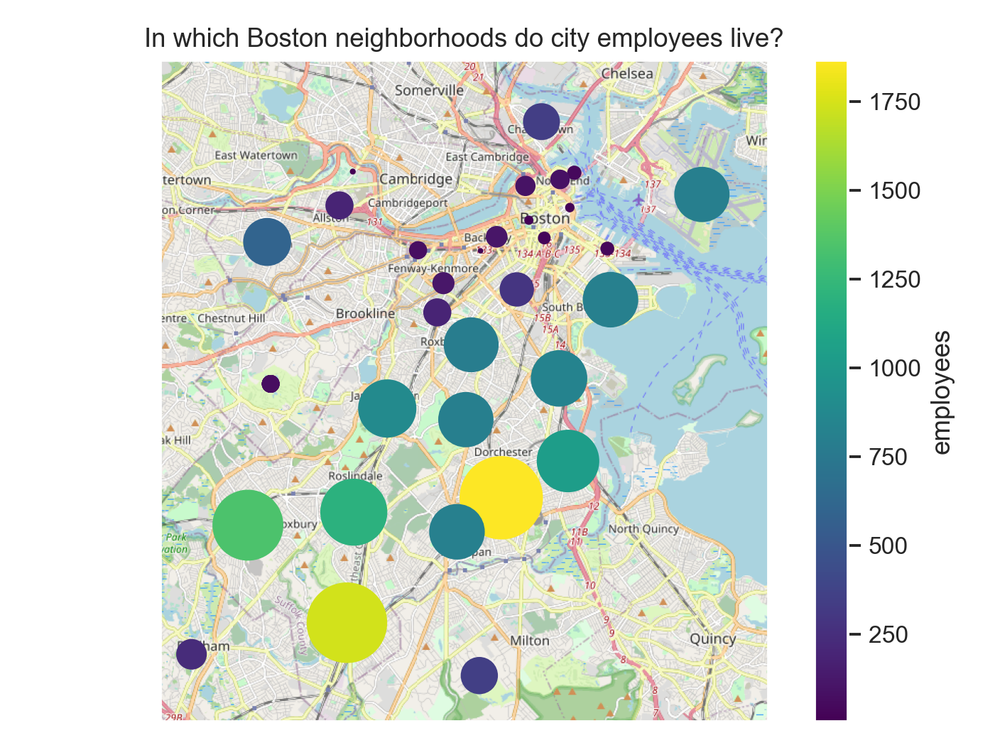

In [583]:
# map functions
import cartopy.feature as cfeature
import cartopy.crs as ccrs
from cartopy.io.img_tiles import OSM
osm_tiles = OSM()


fig = plt.figure()
ax = plt.axes( projection= osm_tiles.crs)

# define map range (city of Boston)
img_extent = (-71.19, -70.985, 42.395, 42.23)
ax.set_extent(img_extent, ccrs.PlateCarree())

# add map image
ax.add_image(osm_tiles, 12)

# boston data
boston.plot('long','lat', kind='scatter', marker='.', s=boston['employees'].values*3, c='employees', cmap=plt.cm.viridis, ax=ax, transform=ccrs.PlateCarree())

ax.set_title('In which Boston neighborhoods do city employees live?')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


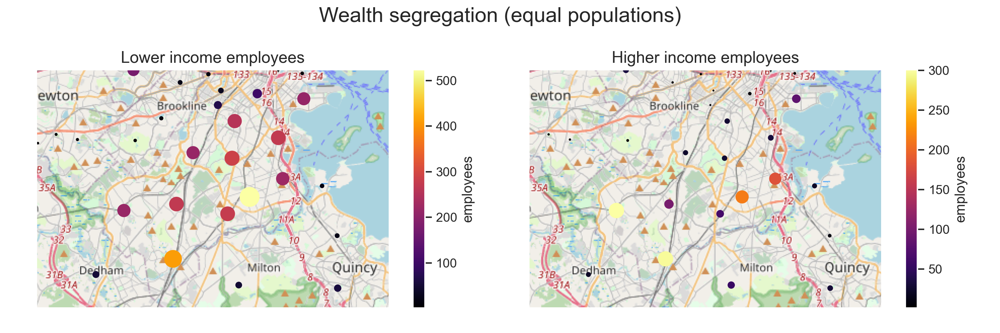

In [589]:
fig, (ax1, ax2) = plt.subplots(ncols=2, subplot_kw={'projection': osm_tiles.crs}, figsize=(12, 4))

# define map range
img_extent = (-71.22, -70.98, 42.35, 42.23)
ax1.set_extent(img_extent, ccrs.PlateCarree())
ax2.set_extent(img_extent, ccrs.PlateCarree())

# # add map image, state lines
ax1.add_image(osm_tiles, 11)
ax2.add_image(osm_tiles, 11)

poor.plot('long','lat', kind='scatter', marker='.', s=poor['employees'].values*2, c='employees', cmap=plt.cm.inferno, ax=ax1, transform=ccrs.PlateCarree())
rich.plot('long','lat', kind='scatter', marker='.', s=rich['employees'].values*2, c='employees', cmap=plt.cm.inferno, ax=ax2, transform=ccrs.PlateCarree())

ax1.set_title('Lower income employees', fontsize=14)
ax2.set_title('Higher income employees', fontsize=14)
plt.suptitle('Wealth segregation (equal populations)', fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()